<center>
    <img src="https://weclouddata.s3.amazonaws.com/images/logos/wcd_logo_new_2.png" width='30%'> 
</center>

----------

<h1 align="center"> Case Study - Telecom Churn </h1>
<br>
<center align="left"> <font size='4'>  Developed by: </font><font size='4' color='#33AAFBD'>WeCloudData Academy </font></center>
<br>

----------

### Customer churn prediction: Telecom Churn Dataset
Customer churn, also known as customer retention, customer turnover, or customer defection, is the loss of clients or customers.

Telephone service companies, Internet service providers, pay TV companies, insurance firms, and alarm monitoring services, often use customer attrition analysis and customer attrition rates as one of their key business metrics because the cost of retaining an existing customer is far less than acquiring a new one. Companies from these sectors often have customer service branches which attempt to win back defecting clients, because recovered long-term customers can be worth much more to a company than newly recruited clients.

Companies usually make a distinction between voluntary churn and involuntary churn. Voluntary churn occurs due to a decision by the customer to switch to another company or service provider, involuntary churn occurs due to circumstances such as a customer's relocation to a long-term care facility, death, or the relocation to a distant location. In most applications, involuntary reasons for churn are excluded from the analytical models. Analysts tend to concentrate on voluntary churn, because it typically occurs due to factors of the company-customer relationship which companies control, such as how billing interactions are handled or how after-sales help is provided.

predictive analytics use churn prediction models that predict customer churn by assessing their propensity of risk to churn. Since these models generate a small prioritized list of potential defectors, they are effective at focusing customer retention marketing programs on the subset of the customer base who are most vulnerable to churn.

#### About Telecom Churn Dataset

Each row represents a customer; each column contains customer’s attributes.
The datasets have the following attributes or features:

- State: string
- Account length: integer
- Area code: integer
- International plan: string
- Voice mail plan: string
- Number vmail messages: integer
- Total day minutes: double
- Total day calls: integer
- Total day charge: double
- Total eve minutes: double
- Total eve calls: integer
- Total eve charge: double
- Total night minutes: double
- Total night calls: integer
- Total night charge: double
- Total intl minutes: double
- Total intl calls: integer
- Total intl charge: double
- Customer service calls: integer
- Churn: string
- The "churn-bigml-80" dataset contains 2666 rows (customers) and 20 columns (features).
- The "Churn" column is the target to predict.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from category_encoders import CountEncoder,OneHotEncoder, TargetEncoder
from sklearn.feature_selection import SelectKBest, mutual_info_classif, chi2
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from imblearn.over_sampling import SMOTE
from scipy.stats import shapiro
from pandas_profiling import ProfileReport

%matplotlib inline

/var/folders/kp/sndy1z714b36d8j4h21ggmym0000gn/T/ipykernel_94703/756598103.py:26: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [3]:
df = pd.read_csv('./churn-bigml-80.csv')

## Exploratory Data Analysis (EDA)

In [4]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [5]:
profile = ProfileReport(df)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [6]:
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [32]:
df.duplicated().sum()

0

In [24]:
features = df.drop(columns=['State','International plan','Voice mail plan'])
skewed = []
for column in features.columns:
    statistic, p_value = shapiro(df[column])
    alpha = 0.05
    if p_value < alpha:
       skewed.append(column)
print("These columns: ")
for column in skewed:
    print(f" {column} ")
print("are NOT normally distributed")

These columns: 
 Account length 
 Area code 
 Number vmail messages 
 Total day calls 
 Total eve calls 
 Total intl minutes 
 Total intl calls 
 Total intl charge 
 Customer service calls 
 Churn 
are NOT normally distributed


In [62]:
# Define the upper and lower bounds for outlier detection
outlier_multiplier = 1.5

# Loop through each column in the DataFrame and check for outliers using IQR
for column in df.columns:
    if (df[column].dtype != 'object') & (df[column].dtype != 'bool'):  # Exclude non-numeric columns
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        upper_bound = Q3 + outlier_multiplier * IQR
        lower_bound = Q1 - outlier_multiplier * IQR
        has_outliers = any((df[column] < lower_bound) | (df[column] > upper_bound))
        print(f"{column}: {'Has outliers' if has_outliers else 'No outliers'}")

Account length: Has outliers
Area code: No outliers
Number vmail messages: Has outliers
Total day minutes: Has outliers
Total day calls: Has outliers
Total day charge: Has outliers
Total eve minutes: Has outliers
Total eve calls: Has outliers
Total eve charge: Has outliers
Total night minutes: Has outliers
Total night calls: Has outliers
Total night charge: Has outliers
Total intl minutes: Has outliers
Total intl calls: Has outliers
Total intl charge: Has outliers
Customer service calls: Has outliers


### Target Variable

- Explore the value of target variable

In [29]:
y = df['Churn']
print(f'Percentage of customers churned: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} customers)\nPercentage of customers who did not churn: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} customers)')

Percentage of customers churned: % 14.55 --> (388 customers)
Percentage of customers who did not churn: % 85.45 --> (2278 customers)


- 85.45% of the instances of our target variable is "Did not churn"
- 2278 customer did not churn
- 14.55% of the instances of our target variable is "Churned"
- 388 consumers churned
We have imbalanced data.

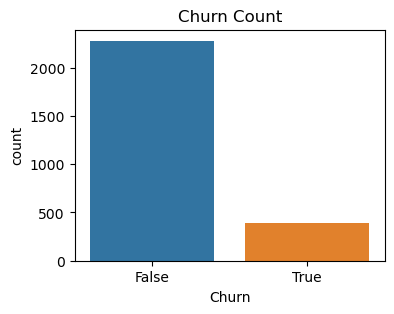

In [42]:
# Countplot of Churn
plt.figure(figsize=(4,3))
sns.countplot(x='Churn', data=df)
plt.title('Churn Count')
plt.show()

Remarks:

- There are approximately 6 times more consumers who did not churnin the data than who did, so we can say that the 'not-churned' class dominates the 'churned' class
- Which is a strong indicator of class imbalance

### Features

In [30]:
categorical_cols = ['State', 'International plan', 'Voice mail plan']
numeric_cols = ['Account length', 'Number vmail messages', 'Total day minutes', 'Total day calls',
                'Total eve minutes', 'Total eve calls', 'Total night minutes', 'Total night calls',
                'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls']

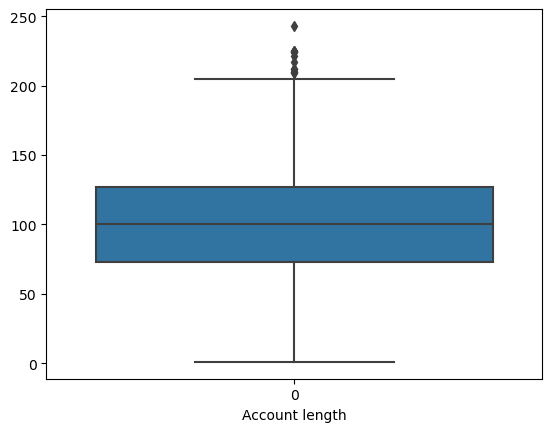

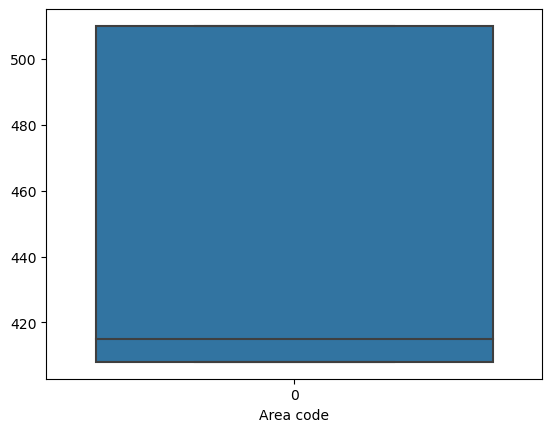

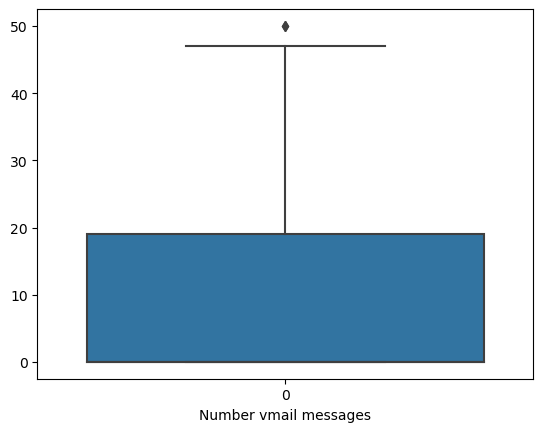

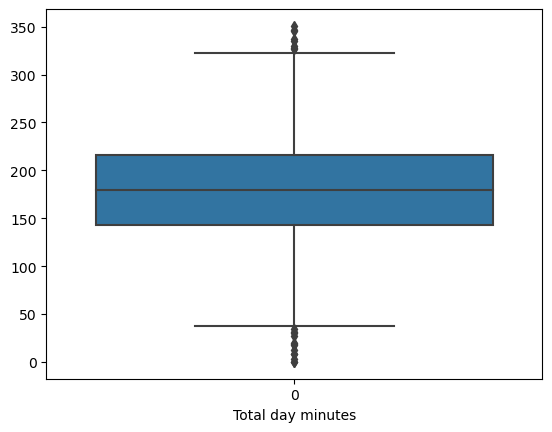

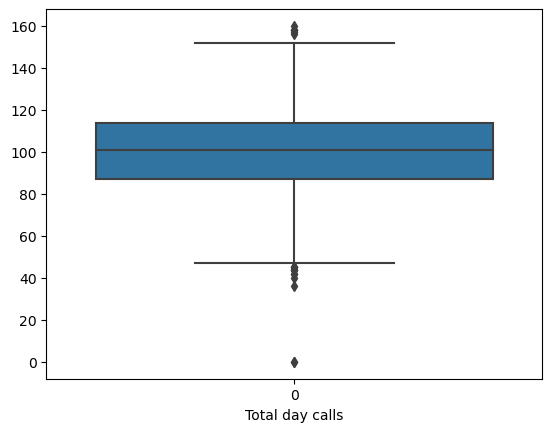

...

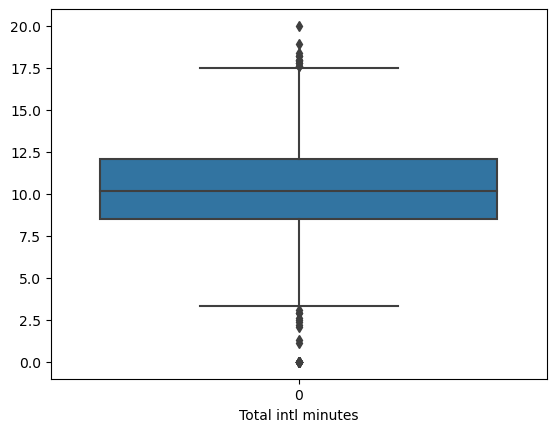

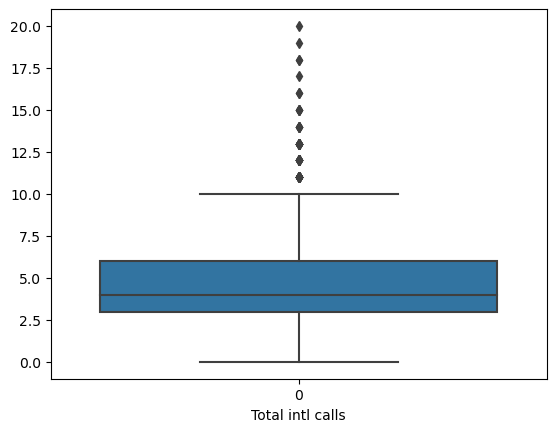

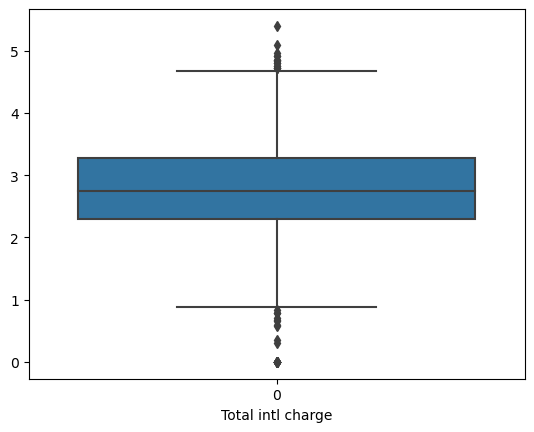

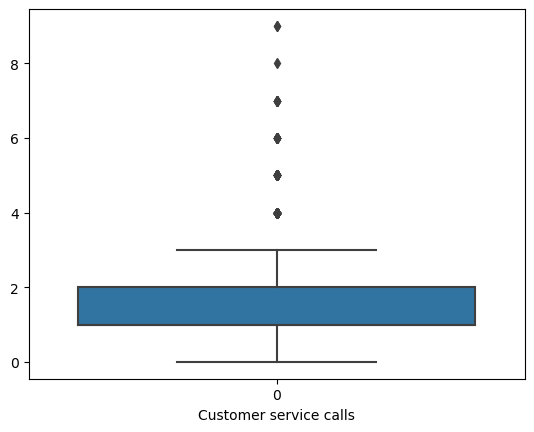

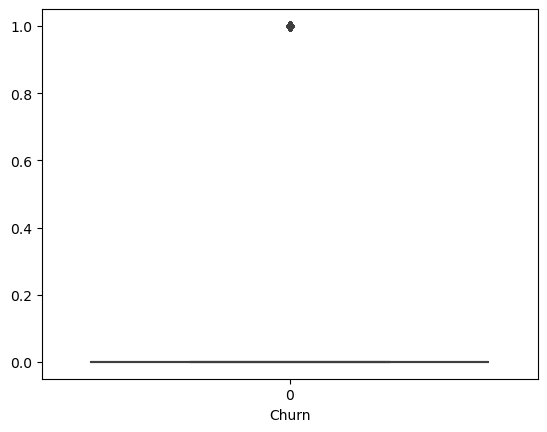

In [77]:
features = df.drop(columns=['State','International plan','Voice mail plan'])
for i, col in enumerate(features.columns):
    plt.figure(i)
    gf = sns.boxplot(data = features[col])
    gf.set_xlabel(col)

<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


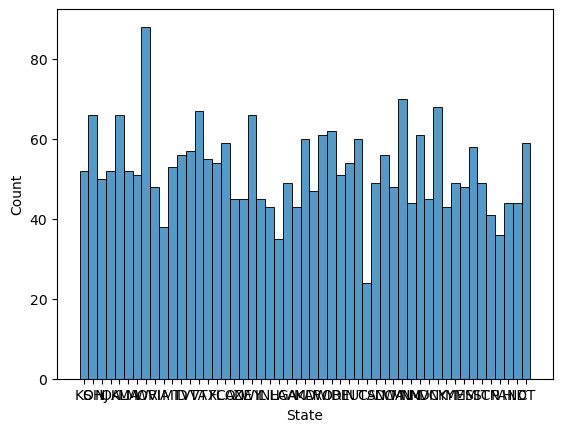

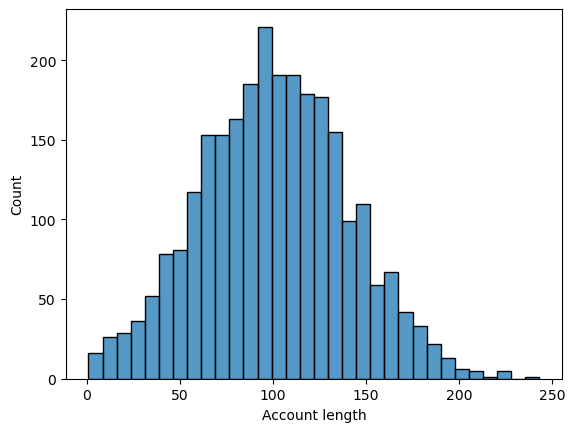

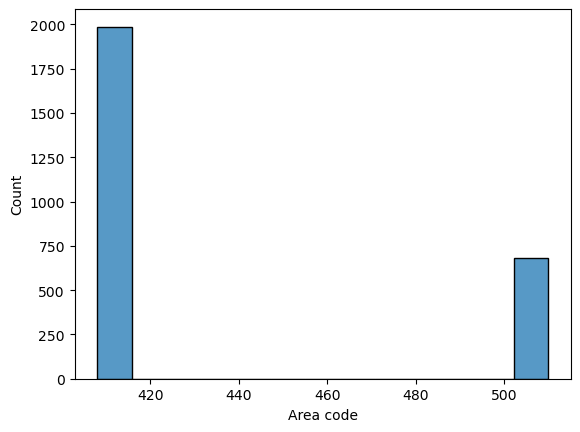

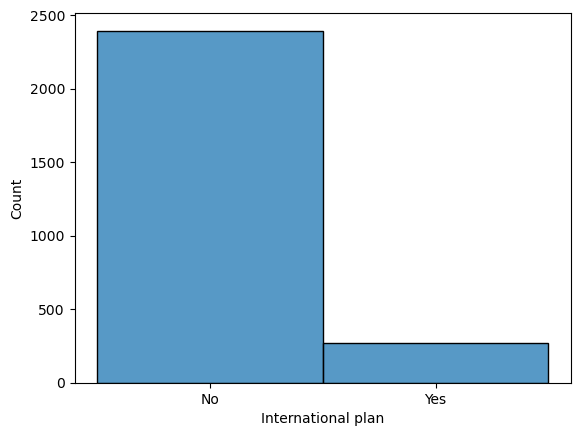

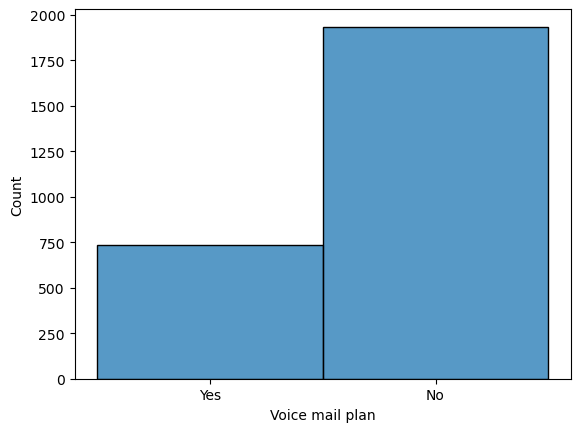

...

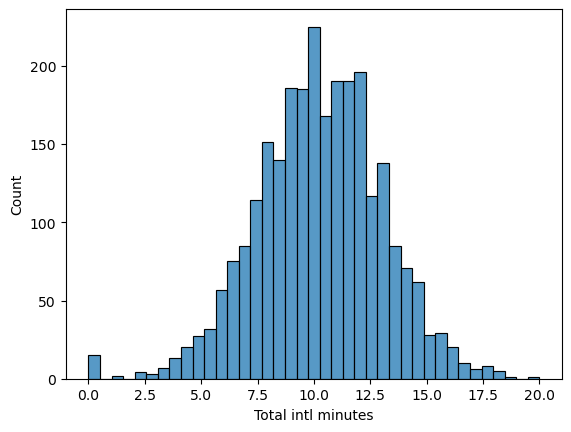

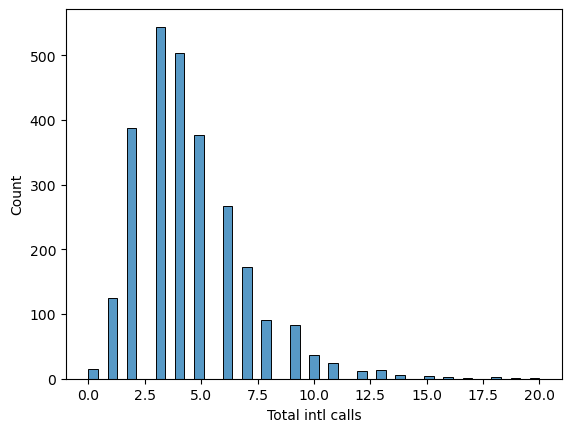

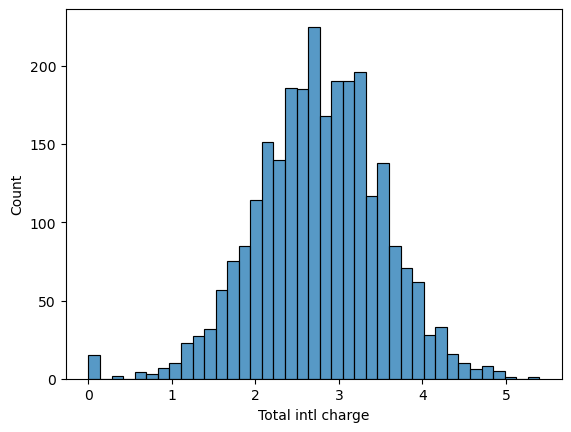

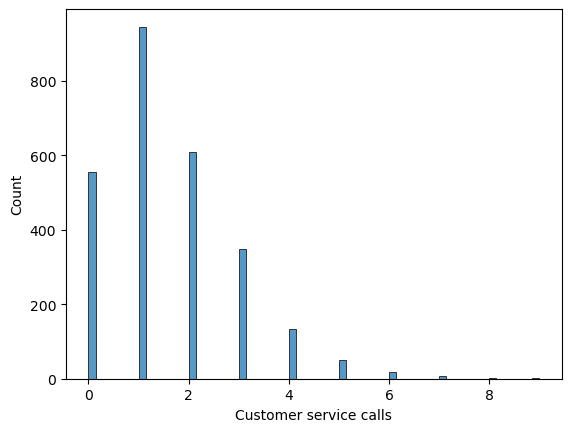

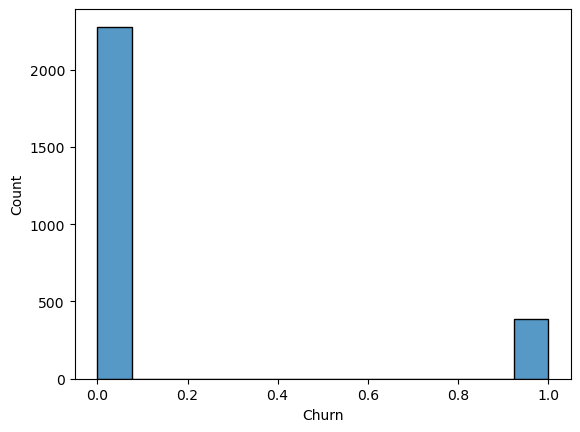

In [72]:
# Plot the distribution
for i, col in enumerate(df.columns):
    plt.figure(i)
    sns.histplot(df[col])

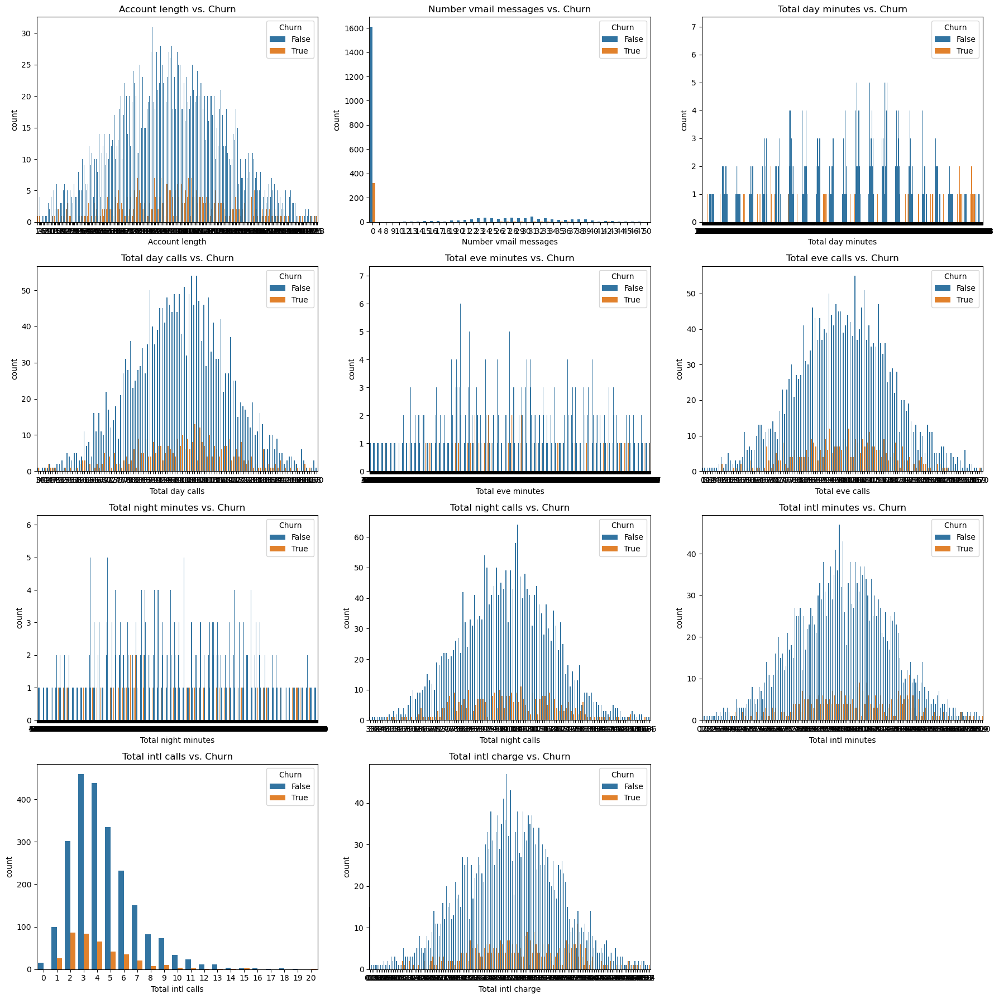

In [10]:
# Barplot to visualize the distribution of numeric features for Churned vs. Did Not Churn
plt.figure(figsize=(18,18))  # Increase the height to prevent overlapping titles
for i, col in enumerate(numeric_cols[:-1]):
    plt.subplot(4, 3, i + 1)  # Adjust the subplot layout
    sns.countplot(x=col, hue='Churn', data=df)
    plt.title(f'{col} vs. Churn')
    plt.xticks(rotation=0)  # Rotate the x-axis labels to avoid overlapping

plt.tight_layout()
plt.show()

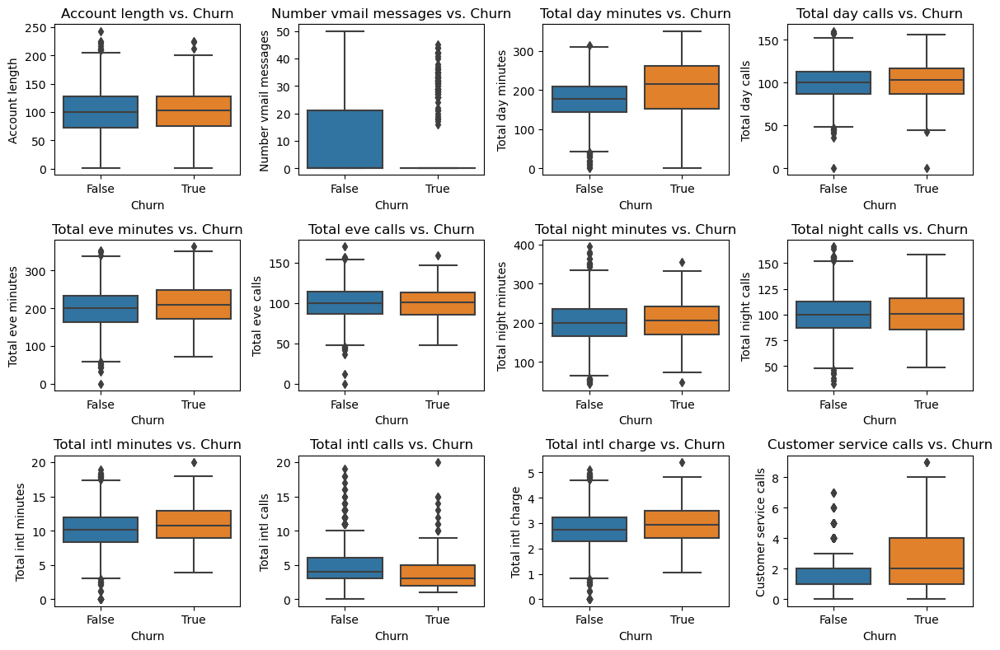

In [46]:
# Boxplot to visualize the distribution of numeric features for Churned vs. Did Not Churn
plt.figure(figsize=(12, 8))  # Increase the height to prevent overlapping titles
for i, col in enumerate(numeric_cols[:-1]):
    plt.subplot(3, 4, i + 1)  # Adjust the subplot layout
    sns.boxplot(x='Churn', y=col, data=df)
    plt.title(f'{col} vs. Churn')
    plt.xticks(rotation=0)  # Rotate the x-axis labels to avoid overlapping

plt.tight_layout()
plt.show()

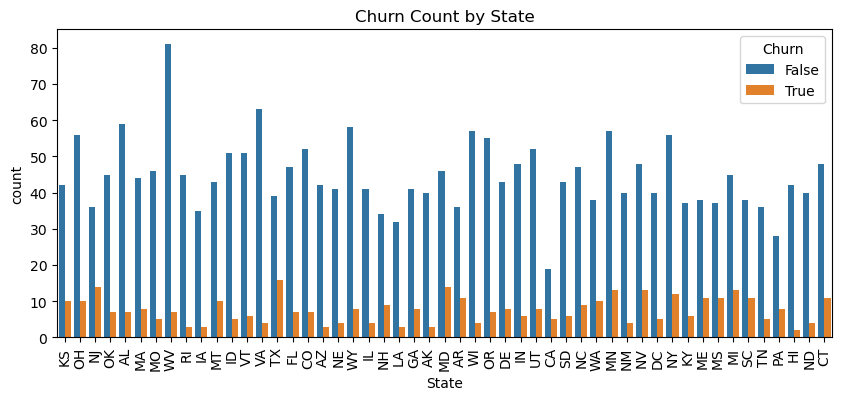

In [67]:
# Barplot of Churn by State
plt.figure(figsize=(10, 4))
sns.countplot(x='State', hue='Churn', data=df)
plt.title('Churn Count by State')
plt.xticks(rotation=90)
plt.show()

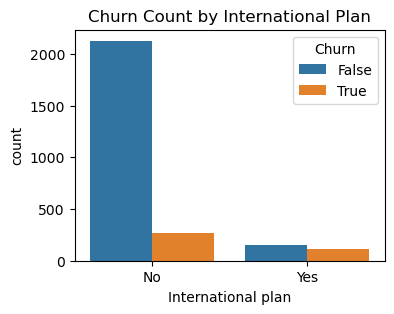

In [66]:
# Barplot of Churn by International Plan
plt.figure(figsize=(4, 3))
sns.countplot(x='International plan', hue='Churn', data=df)
plt.title('Churn Count by International Plan')
plt.show()

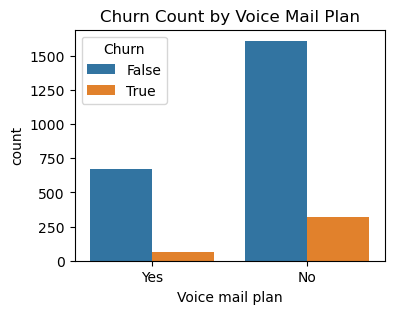

In [69]:
# Barplot of Churn by Voice Mail Plan
plt.figure(figsize=(4, 3))
sns.countplot(x='Voice mail plan', hue='Churn', data=df)
plt.title('Churn Count by Voice Mail Plan')
plt.show()

C:\Users\TrucLe\AppData\Local\Temp\ipykernel_21528\4137570652.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")


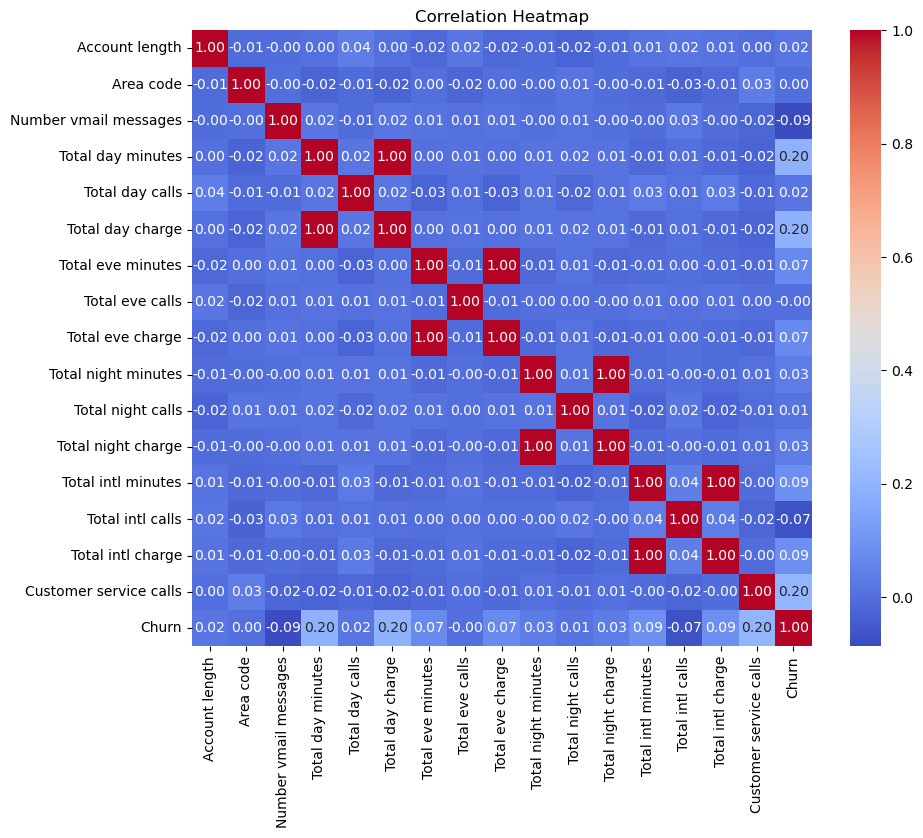

In [73]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

## Feature Engineering

- Create new features

In [112]:
df['Total charge'] = df['Total day charge'] + df['Total eve charge'] + df['Total night charge']
df['Total charge']

0       72.86
1       55.54
2       59.00
3       65.02
4       49.36
        ...  
2661    48.98
2662    57.43
2663    60.94
2664    63.93
2665    73.31
Name: Total charge, Length: 2666, dtype: float64

In [113]:
# Data Encoding
df['International plan'] = df['International plan'].map({'No': 0, 'Yes': 1})
df['Voice mail plan'] = df['Voice mail plan'].map({'No': 0, 'Yes': 1})
df['Churn'] = df['Churn'].astype(int)

In [164]:
categorical_cols = ['State', 'International plan', 'Voice mail plan']
numeric_cols = ['Account length', 'Number vmail messages', 'Total day minutes', 'Total day calls',
                'Total eve minutes', 'Total eve calls', 'Total night minutes', 'Total night calls',
                'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Total charge']

C:\Users\TrucLe\AppData\Local\Temp\ipykernel_19964\4137570652.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")


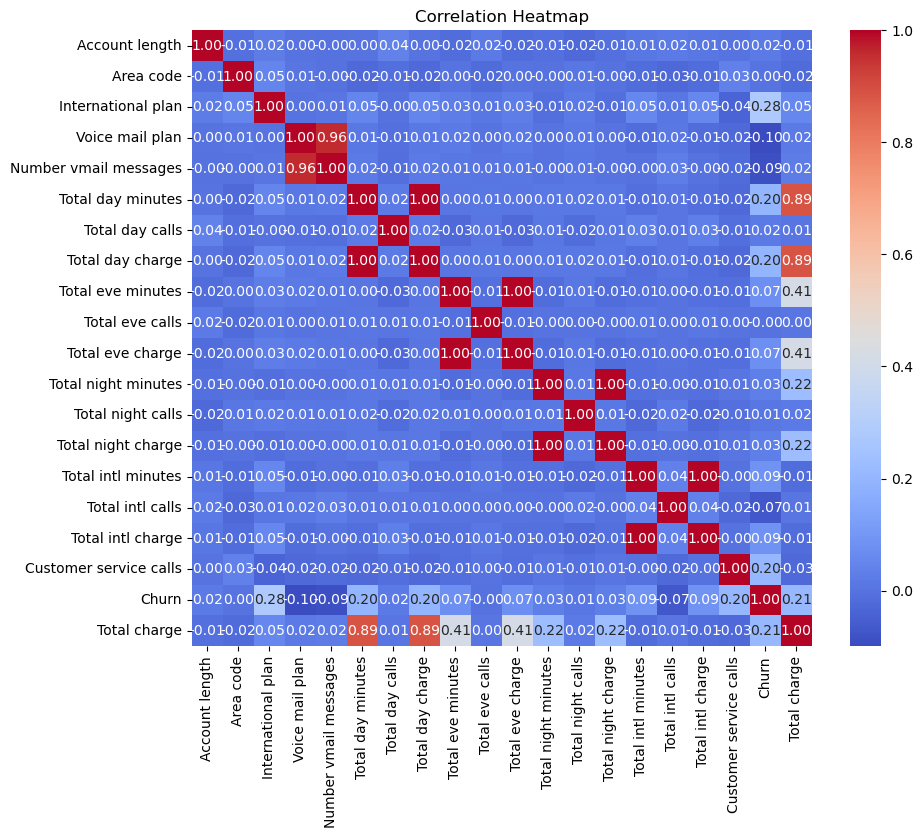

In [193]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

## Baseline model

In [33]:
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,...,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Total charge
0,KS,128,415,0,1,25,265.1,110,45.07,197.4,...,16.78,244.7,91,11.01,10.0,3,2.70,1,0,72.86
1,OH,107,415,0,1,26,161.6,123,27.47,195.5,...,16.62,254.4,103,11.45,13.7,3,3.70,1,0,55.54
2,NJ,137,415,0,0,0,243.4,114,41.38,121.2,...,10.30,162.6,104,7.32,12.2,5,3.29,0,0,59.00
3,OH,84,408,1,0,0,299.4,71,50.90,61.9,...,5.26,196.9,89,8.86,6.6,7,1.78,2,0,65.02
4,OK,75,415,1,0,0,166.7,113,28.34,148.3,...,12.61,186.9,121,8.41,10.1,3,2.73,3,0,49.36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,0,0,0,134.7,98,22.90,189.7,...,16.12,221.4,128,9.96,11.8,5,3.19,2,0,48.98
2662,AZ,192,415,0,1,36,156.2,77,26.55,215.5,...,18.32,279.1,83,12.56,9.9,6,2.67,2,0,57.43
2663,WV,68,415,0,0,0,231.1,57,39.29,153.4,...,13.04,191.3,123,8.61,9.6,4,2.59,3,0,60.94
2664,RI,28,510,0,0,0,180.8,109,30.74,288.8,...,24.55,191.9,91,8.64,14.1,6,3.81,2,0,63.93


In [116]:
X = df.drop(columns=['Area code','Churn'])
X = pd.get_dummies(X,drop_first=True)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

lr = LogisticRegression(random_state=42)
dt = DecisionTreeClassifier(random_state=42)

lr.fit(X_train, y_train)
dt.fit(X_train, y_train)

y_pred_lr = lr.predict(X_test)
y_pred_dt = dt.predict(X_test)

print('Logistic Regression')
print(' Accuracy: ', lr.score(X_test, y_test))
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred_lr))
print(' Classification Report: ')
print(' Classification Report: ', classification_report(y_test, y_pred_lr))

print('Decision Tree')
print(' Accuracy: ', dt.score(X_test, y_test))
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred_dt))
print(' Classification Report: ')
print(classification_report(y_test, y_pred_dt))

Logistic Regression
 Accuracy:  0.8534090909090909
 ROC AUC Score:  0.528891710277769
 Classification Report: 
 Classification Report:                precision    recall  f1-score   support

           0       0.86      0.99      0.92       751
           1       0.50      0.07      0.12       129

    accuracy                           0.85       880
   macro avg       0.68      0.53      0.52       880
weighted avg       0.81      0.85      0.80       880

Decision Tree
 Accuracy:  0.9363636363636364
 ROC AUC Score:  0.8632004872056895
 Classification Report: 
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       751
           1       0.80      0.76      0.78       129

    accuracy                           0.94       880
   macro avg       0.88      0.86      0.87       880
weighted avg       0.94      0.94      0.94       880



C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# pd.Series(lr.coef_[0], index=X.columns).sort_values().plot(kind='bar');

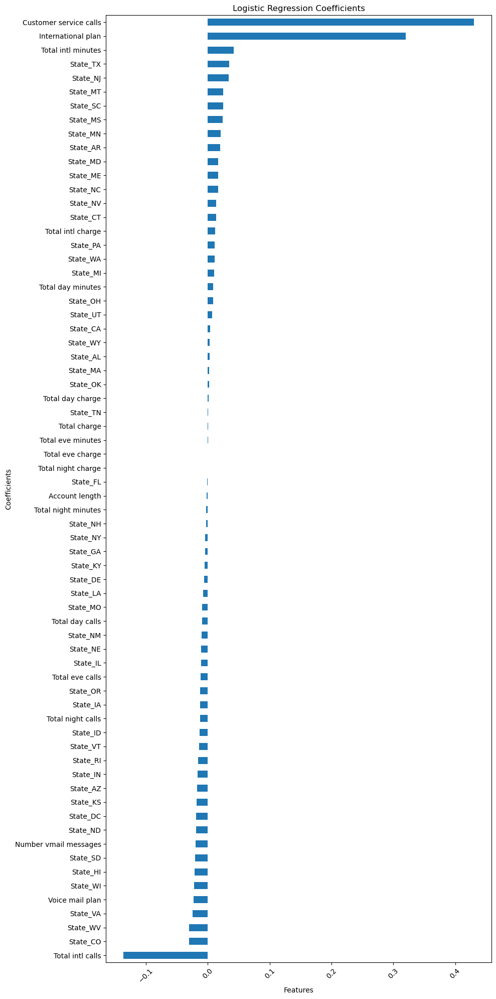

In [21]:
# Create a Series with coefficients and their corresponding feature names
lr_coefficients = pd.Series(lr.coef_[0], index=X.columns).sort_values()

# Create a bar plot with larger figure size and rotated x-axis labels
plt.figure(figsize=(10,20))
lr_coefficients.plot(kind='barh')
plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees
plt.xlabel('Features')
plt.ylabel('Coefficients')
plt.title('Logistic Regression Coefficients')
plt.tight_layout()
plt.show()

In [ ]:
# pd.Series(dt.feature_importances_, index=X.columns).sort_values().plot(kind='bar');

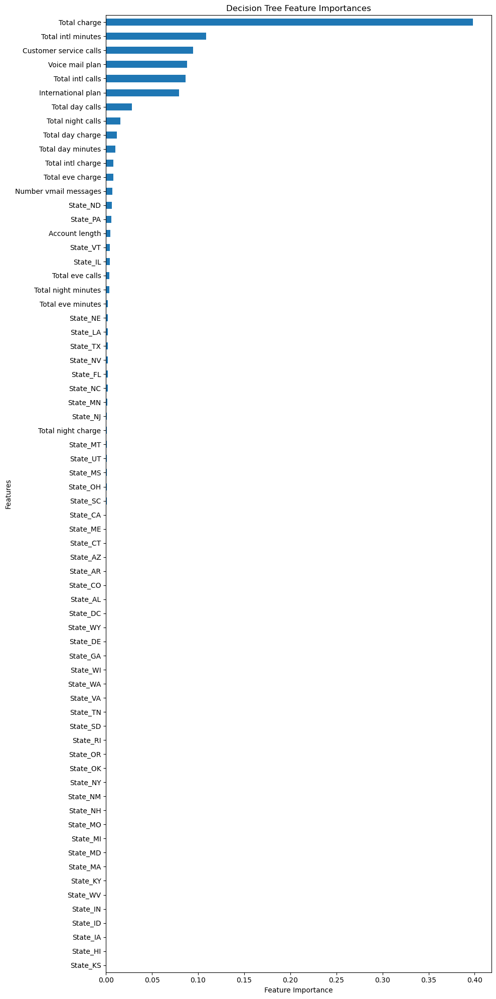

In [22]:
# Create a Series with feature importances and their corresponding feature names
dt_feature_importances = pd.Series(dt.feature_importances_, index=X.columns).sort_values()

# Create a horizontal bar plot with larger figure size and rotated x-axis labels
plt.figure(figsize=(10, 20))
dt_feature_importances.plot(kind='barh')  # Use 'barh' for horizontal bar plot
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Decision Tree Feature Importances')
plt.tight_layout()
plt.show()

In [115]:
# Scale the data, use Robust method
# as the data contain outliers

X = df.drop(columns=['Area code','Churn'])
X = pd.get_dummies(X,drop_first=True)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

lr = LogisticRegression(random_state=42)
dt = DecisionTreeClassifier(random_state=42)

scaler = RobustScaler()
X_train_robust_scaled = scaler.fit_transform(X_train)
X_test_robust_scaled = scaler.transform(X_test)

lr.fit(X_train_robust_scaled, y_train)
dt.fit(X_train_robust_scaled, y_train)

y_pred_lr = lr.predict(X_test)
y_pred_dt = dt.predict(X_test)


print('Logistic Regression')
print(' Accuracy: ', lr.score(X_test_robust_scaled, y_test))
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred_lr))
print(' Classification Report: ')
print(' Classification Report: ', classification_report(y_test, y_pred_lr))

print('Decision Tree')
print(' Accuracy: ', dt.score(X_test_robust_scaled, y_test))
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred_dt))
print(' Classification Report: ')
print(classification_report(y_test, y_pred_dt))

Logistic Regression
 Accuracy:  0.8568181818181818
 ROC AUC Score:  0.5
 Classification Report: 
 Classification Report:                precision    recall  f1-score   support

           0       0.00      0.00      0.00       751
           1       0.15      1.00      0.26       129

    accuracy                           0.15       880
   macro avg       0.07      0.50      0.13       880
weighted avg       0.02      0.15      0.04       880

Decision Tree
 Accuracy:  0.9363636363636364
 ROC AUC Score:  0.503447599582985
 Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.01      0.03       751
           1       0.15      0.99      0.26       129

    accuracy                           0.16       880
   macro avg       0.53      0.50      0.14       880
weighted avg       0.80      0.16      0.06       880



C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\TrucLe\anac

In [128]:
# Using Random Forest
X = df.drop(columns=['Area code','Churn'])
X = pd.get_dummies(X,drop_first=True)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

model = RandomForestClassifier(n_estimators=1000, random_state=42)

model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

print('Train score:', accuracy_score(y_train, y_pred_train))
print('Test score:', accuracy_score(y_test, y_pred_test))
print('ROC AUC Score: ', roc_auc_score(y_test, y_pred_test))
print('Classification Report: ')
print(classification_report(y_test, y_pred_test))

Train score: 1.0
Test score: 0.9545454545454546
ROC AUC Score:  0.8449612403100775
Classification Report: 
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       751
           1       1.00      0.69      0.82       129

    accuracy                           0.95       880
   macro avg       0.97      0.84      0.90       880
weighted avg       0.96      0.95      0.95       880



In [126]:
# Using Decision Tree
X = df.drop(columns=['Area code','Churn'])
X = pd.get_dummies(X,drop_first=True)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

model = DecisionTreeClassifier(max_depth=30, random_state=42)

model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

print('Train score:', accuracy_score(y_train, y_pred_train))
print('Test score:', accuracy_score(y_test, y_pred_test))
print('ROC AUC Score: ', roc_auc_score(y_test, y_pred_test))
print('Classification Report: ')
print(classification_report(y_test, y_pred_test))

Train score: 1.0
Test score: 0.9363636363636364
ROC AUC Score:  0.8632004872056895
Classification Report: 
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       751
           1       0.80      0.76      0.78       129

    accuracy                           0.94       880
   macro avg       0.88      0.86      0.87       880
weighted avg       0.94      0.94      0.94       880



## Feature Engineering

- Do Column Transformer

In [93]:
X = df.drop(columns=['Area code','Churn'])
y = df['Churn']

In [94]:
# Transformers for numeric and categorical features
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

state_encoder = LabelEncoder()
X['State_encoded'] = state_encoder.fit_transform(X['State'])


In [95]:
# Define the preprocessor using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols),
        ('cat', categorical_transformer, ['International plan', 'Voice mail plan']),
    ])

# Encode features using the preprocessor
X_encoded = preprocessor.fit_transform(X.drop(columns=['State']))  # Drop the original 'State' column

In [ ]:
# label_encoder = LabelEncoder()
# data['State'] = label_encoder.fit_transform(data['State'])

In [117]:
# # Split data into features (X) and target (y)
# X = df.drop(['Churn','Area code'], axis=1)
# y = df['Churn']

In [96]:
# Concatenate the 'State_encoded' column with the encoded features
X_encoded_df = pd.DataFrame(X_encoded, columns=numeric_cols + \
                                                   preprocessor.named_transformers_['cat']['onehot']\
                                                   .get_feature_names_out(['International plan', 'Voice mail plan'])\
                                                   .tolist())

# Add the 'State_encoded' column back to the DataFrame
X_encoded_df['State_encoded'] = X['State_encoded']

In [43]:
X_encoded_df

,Account length,Number vmail messages,Total day minutes,Total day calls,Total eve minutes,Total eve calls,Total night minutes,Total night calls,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,International plan_0,International plan_1,Voice mail plan_0,Voice mail plan_1,State_encoded
0,0.692163,1.247508,1.579670,0.484868,-0.058619,-0.050781,0.857403,-0.469031,-0.085020,-0.597527,-0.085681,-0.429172,1.0,0.0,0.0,1.0,16
1,0.161278,1.320985,-0.329918,1.135375,-0.095916,0.147654,1.048458,0.149054,1.242179,-0.597527,1.242921,-0.429172,1.0,0.0,0.0,1.0,35
2,0.919686,-0.589414,1.179302,0.685024,-1.554439,0.494917,-0.759668,0.200561,0.704125,0.216894,0.698194,-1.191955,1.0,0.0,1.0,0.0,31
3,-0.420168,-0.589414,2.212509,-1.466653,-2.718509,-0.596479,-0.084083,-0.572045,-1.304609,1.031314,-1.307995,0.333610,0.0,1.0,1.0,0.0,35
4,-0.647691,-0.589414,-0.235822,0.634985,-1.022461,1.090224,-0.281046,1.076181,-0.049150,-0.597527,-0.045823,1.096392,0.0,1.0,1.0,0.0,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,-0.546569,-0.589414,-0.826226,-0.115600,-0.209771,-1.588658,0.398478,1.436730,0.560644,0.216894,0.565334,0.333610,1.0,0.0,1.0,0.0,40
2662,2.310100,2.055754,-0.429549,-1.166419,0.296687,1.288660,1.534958,-0.881087,-0.120891,0.624104,-0.125539,0.333610,1.0,0.0,0.0,1.0,3
2663,-0.824652,-0.589414,0.952365,-2.167199,-0.922347,-2.233574,-0.194382,1.179195,-0.228501,-0.190317,-0.231828,1.096392,1.0,0.0,1.0,0.0,49
2664,-1.835863,-0.589414,0.024324,0.434829,1.735580,-2.084747,-0.182564,-0.469031,1.385660,0.624104,1.389067,0.333610,1.0,0.0,1.0,0.0,39


In [97]:
min_max_scaler = MinMaxScaler()
X_encoded_scaled = min_max_scaler.fit_transform(X_encoded_df)

In [142]:
X_encoded_scaled_df = pd.DataFrame(X_encoded_scaled, columns=X_encoded_df.columns)
X_encoded_scaled_df

,Account length,Number vmail messages,Total day minutes,Total day calls,Total eve minutes,Total eve calls,Total night minutes,Total night calls,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Total charge,International plan_0,International plan_1,Voice mail plan_0,Voice mail plan_1,State_encoded
0,0.524793,0.50,0.755701,0.68750,0.542755,0.582353,0.572161,0.436090,0.500,0.15,0.500000,0.111111,0.728575,1.0,0.0,0.0,1.0,0.32
1,0.438017,0.52,0.460661,0.76875,0.537531,0.605882,0.599772,0.526316,0.685,0.15,0.685185,0.111111,0.489942,1.0,0.0,0.0,1.0,0.70
2,0.561983,0.00,0.693843,0.71250,0.333242,0.647059,0.338457,0.533835,0.610,0.25,0.609259,0.000000,0.537614,1.0,0.0,1.0,0.0,0.62
3,0.342975,0.00,0.853478,0.44375,0.170195,0.517647,0.436095,0.421053,0.330,0.35,0.329630,0.222222,0.620557,0.0,1.0,1.0,0.0,0.70
4,0.305785,0.00,0.475200,0.70625,0.407754,0.717647,0.407629,0.661654,0.505,0.15,0.505556,0.333333,0.404795,0.0,1.0,1.0,0.0,0.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,0.322314,0.00,0.383979,0.61250,0.521584,0.400000,0.505835,0.714286,0.590,0.25,0.590741,0.222222,0.399559,1.0,0.0,1.0,0.0,0.80
2662,0.789256,0.72,0.445268,0.48125,0.592521,0.741176,0.670083,0.375940,0.495,0.30,0.494444,0.222222,0.515982,1.0,0.0,0.0,1.0,0.06
2663,0.276860,0.00,0.658780,0.35625,0.421776,0.323529,0.420154,0.676692,0.480,0.20,0.479630,0.333333,0.564343,1.0,0.0,1.0,0.0,0.98
2664,0.111570,0.00,0.515393,0.68125,0.794061,0.341176,0.421862,0.436090,0.705,0.30,0.705556,0.222222,0.605539,1.0,0.0,1.0,0.0,0.78


In [99]:
# Feature Selection using Mutual Information and Chi-Squared
mutual_info = SelectKBest(mutual_info_classif, k='all')
chi2_test = SelectKBest(chi2, k='all')

In [100]:
X_mutual_info = mutual_info.fit_transform(X_encoded_scaled, y)
X_chi2 = chi2_test.fit_transform(X_encoded_scaled, y)

In [101]:
# Choose the top 'k' features based on mutual information and chi-squared test
k = 10  # Number of top features to select

# Get the selected features using the indexes obtained from mutual_info and chi2_test
top_features_mutual_info = X_encoded_scaled_df.columns[mutual_info.get_support()]
top_features_chi2 = X_encoded_scaled_df.columns[chi2_test.get_support()]

# Select the top 'k' features from each method and combine them
top_k_features = list(set(top_features_mutual_info[:k]).union(set(top_features_chi2[:k])))

In [102]:
# Display the top 'k' features from mutual information
print("Top features selected using Mutual Information:")
print(top_features_mutual_info[:k])

Top features selected using Mutual Information:
Index(['Account length', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total eve minutes', 'Total eve calls',
       'Total night minutes', 'Total night calls', 'Total intl minutes',
       'Total intl calls'],
      dtype='object')


In [103]:
# Calculate mutual information scores for all features
mutual_info_scores = mutual_info_classif(X_encoded_scaled_df, y)

# Create a dictionary to associate features with their scores
feature_scores_dict_mi = dict(zip(X_encoded_scaled_df.columns, mutual_info_scores))

# Sort the features based on their mutual information scores in descending order
sorted_feature_scores_mi = sorted(feature_scores_dict_mi .items(), key=lambda x: x[1], reverse=True)

# Get the top 'k' features and their scores
k = 19  # Number of top features to select
top_features_with_scores_mi = sorted_feature_scores_mi[:k]

# Display the top 'k' features along with their scores
print("Top features selected using Mutual Information:")
for feature, score in top_features_with_scores_mi:
    print(f"{feature}: {score:.4f}")

Top features selected using Mutual Information:
Total charge: 0.0775
Total day minutes: 0.0431
International plan_0: 0.0297
International plan_1: 0.0283
Customer service calls: 0.0253
Number vmail messages: 0.0145
Total intl charge: 0.0123
Total intl minutes: 0.0072
Voice mail plan_0: 0.0065
Voice mail plan_1: 0.0029
Total eve calls: 0.0021
Account length: 0.0000
Total day calls: 0.0000
Total eve minutes: 0.0000
Total night minutes: 0.0000
Total night calls: 0.0000
Total intl calls: 0.0000
State_encoded: 0.0000


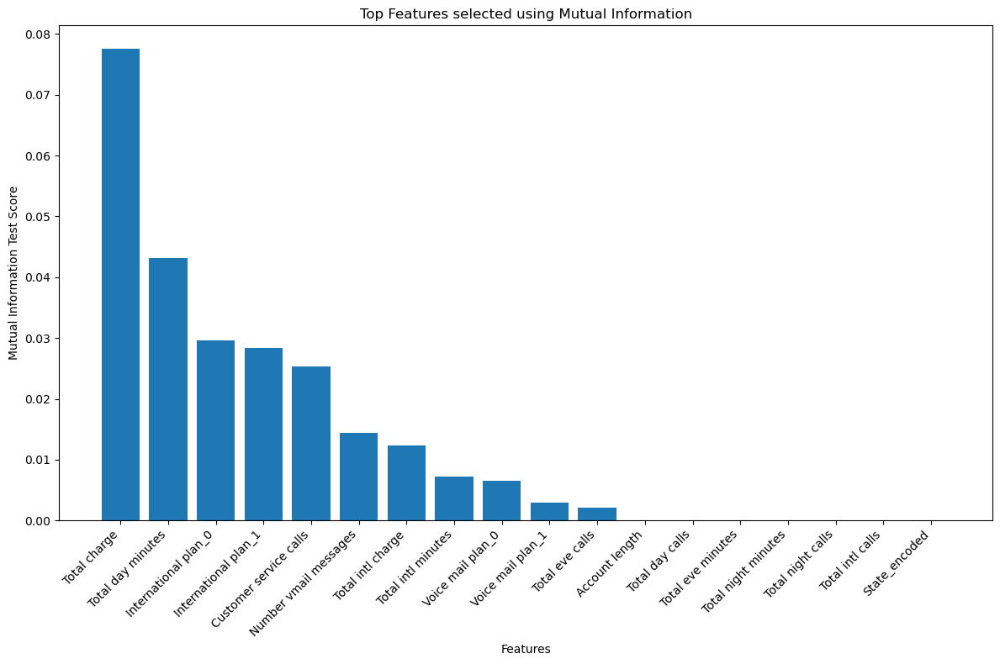

In [104]:
# Extract the top features and scores
top_features_mi = [feature for feature, _ in top_features_with_scores_mi]
scores_mi = [score for _, score in top_features_with_scores_mi]

# Plot the bar chart
plt.figure(figsize=(12, 8))
plt.bar(top_features_mi, scores_mi)
plt.xlabel('Features')
plt.ylabel('Mutual Information Test Score')
plt.title('Top Features selected using Mutual Information')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()

In [105]:
# Display the top 'k' features from chi-squared test
print("Top features selected using Chi-Squared Test:")
print(top_features_chi2[:k])

Top features selected using Chi-Squared Test:
Index(['Account length', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total eve minutes', 'Total eve calls',
       'Total night minutes', 'Total night calls', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Total charge', 'International plan_0', 'International plan_1',
       'Voice mail plan_0', 'Voice mail plan_1', 'State_encoded'],
      dtype='object')


In [106]:
# Calculate chi-squared test scores for all features
chi2_scores, _ = chi2(X_encoded_scaled_df, y)

# Create a dictionary to associate features with their scores
feature_scores_dict_chi = dict(zip(X_encoded_scaled_df.columns, chi2_scores))

# Sort the features based on their chi-squared test scores in descending order
sorted_feature_scores_chi = sorted(feature_scores_dict_chi.items(), key=lambda x: x[1], reverse=True)

# Get the top 'k' features and their scores
k = 19  # Number of top features to select
top_features_with_scores_chi = sorted_feature_scores_chi[:k]

# Display the top 'k' features along with their scores
print("Top features selected using Chi-Squared Test:")
for feature, score in top_features_with_scores_chi:
    print(f"{feature}: {score:.4f}")

Top features selected using Chi-Squared Test:
International plan_1: 184.4921
International plan_0: 20.7900
Voice mail plan_1: 19.0567
Customer service calls: 13.3719
Number vmail messages: 9.2064
Voice mail plan_0: 7.2264
Total charge: 4.8354
Total day minutes: 4.7633
Total intl calls: 0.8788
Total intl minutes: 0.7520
Total intl charge: 0.7520
Total eve minutes: 0.5046
Total night minutes: 0.1406
Account length: 0.0544
Total day calls: 0.0222
Total night calls: 0.0169
Total eve calls: 0.0002
State_encoded: 0.0001


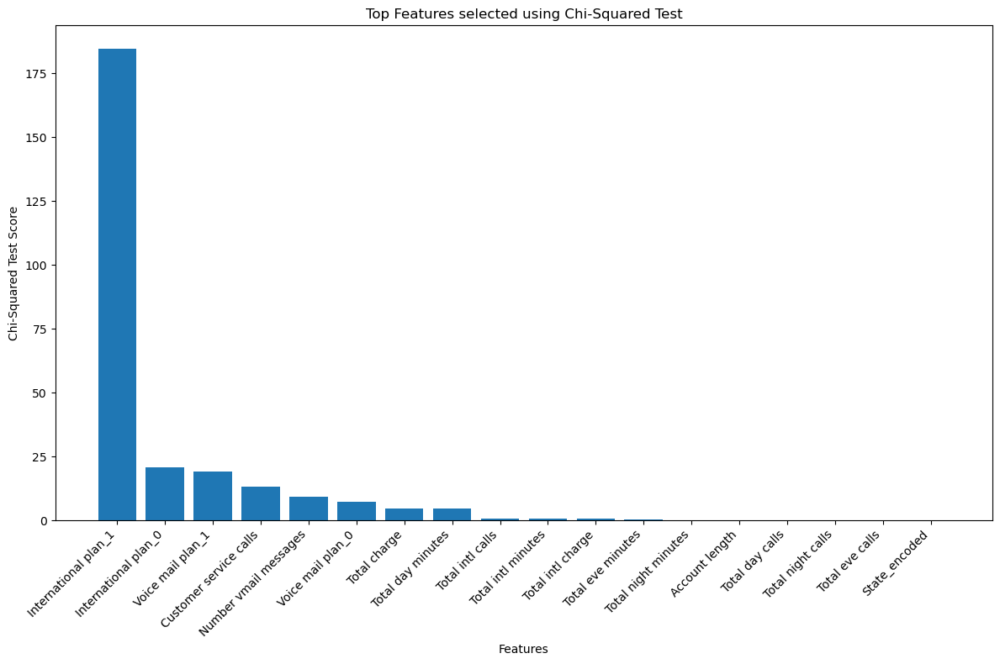

In [107]:
# Extract the top features and scores
top_features_chi = [feature for feature, _ in top_features_with_scores_chi]
scores_chi = [score for _, score in top_features_with_scores_chi]

# Plot the bar chart
plt.figure(figsize=(12, 8))
plt.bar(top_features_chi, scores_chi)
plt.xlabel('Features')
plt.ylabel('Chi-Squared Test Score')
plt.title('Top Features selected using Chi-Squared Test')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()

In [108]:
# Calculate mutual information scores for all features
mutual_info_scores = mutual_info_classif(X_encoded_scaled_df, y)

# Calculate chi-squared test scores for all features
chi2_scores, _ = chi2(X_encoded_scaled_df, y)

# Print the average scores for both methods
avg_mutual_info_score = np.mean(mutual_info_scores)
avg_chi2_score = np.mean(chi2_scores)

print(f"Average Mutual Information Score: {avg_mutual_info_score:.4f}")
print(f"Average Chi-Squared Test Score: {avg_chi2_score:.4f}")

# Choose the method with higher average score
if avg_mutual_info_score > avg_chi2_score:
    print("Mutual Information has higher average score. Choose Mutual Information for feature selection.")
else:
    print("Chi-Squared Test has higher average score. Choose Chi-Squared Test for feature selection.")

Average Mutual Information Score: 0.0147
Average Chi-Squared Test Score: 14.8258
Chi-Squared Test has higher average score. Choose Chi-Squared Test for feature selection.


In [219]:
# Extract the specified columns from X_encoded_df
chi_features = X_encoded_df[['International plan_1', 'International plan_0', 'Voice mail plan_1', 'Customer service calls', 
                             'Number vmail messages', 'Voice mail plan_0','Total charge', 'Total day minutes']].copy()

## Handle outliers

In [129]:
# Handling Outliers
outlier_cols = ['Account length', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 
                'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls',
                'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 
                'Customer service calls']

In [131]:
def remove_outliers(df, cols):
    for col in cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

data = remove_outliers(df, outlier_cols)

## Model Selection & Hyperparameter Tunning

- Use SMOTE to handle imbalanced data
- Use X_encoded_df which handled categorical and numerical data already

In [189]:
# Define feature columns and target variable
# numeric_cols = ['Account length', 'Number vmail messages', 'Total day minutes', 'Total day calls',
#                 'Total eve minutes', 'Total eve calls', 'Total night minutes', 'Total night calls',
#                 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Total charge']
# categorical_cols = ['State', 'International plan', 'Voice mail plan']

X = X_encoded_df
y = df['Churn']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X , y, test_size=0.33, random_state=42)


In [165]:
# Apply SMOTE only to the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Define classifiers to test
classifiers = {
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'XGBoost': xgb.XGBClassifier(random_state=42),
    'Support Vector Machine': SVC(random_state=42),
    'Ensemble Method': VotingClassifier(
        estimators=[
            ('Random Forest', RandomForestClassifier(random_state=42)),
            ('Gradient Boosting', GradientBoostingClassifier(random_state=42)),
            ('XGBoost', xgb.XGBClassifier(random_state=42)),
            ('Support Vector Machine', SVC(random_state=42))
        ],
        voting='hard'
    )
}

# Define hyperparameters for GridSearch
param_grid = {
    'Random Forest': {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'Gradient Boosting': {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    'XGBoost': {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.5],
        'max_depth': [3, 5, 7]
    },
    'Support Vector Machine': {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf']
    },
    'Ensemble Method': {
        'voting': ['hard', 'soft']
    }
}


In [166]:
# Perform GridSearch CV for each classifier
best_models = {}
for name, model in classifiers.items():
    print(f"Training {name}...")
    grid_search = GridSearchCV(model, param_grid[name], cv=StratifiedKFold(n_splits=5), scoring='roc_auc', verbose=1)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    best_models[name] = best_model
    print(f"{name} - Best ROC AUC Score: {grid_search.best_score_}")
    print(f"{name} - Best Parameters: {grid_search.best_params_}")

Training Random Forest...
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Random Forest - Best ROC AUC Score: 0.9255283010269112
Random Forest - Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 200}
Training Gradient Boosting...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Gradient Boosting - Best ROC AUC Score: 0.929812523200974
Gradient Boosting - Best Parameters: {'learning_rate': 0.5, 'max_depth': 5, 'n_estimators': 150}
Training XGBoost...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
XGBoost - Best ROC AUC Score: 0.939823048786972
XGBoost - Best Parameters: {'learning_rate': 0.5, 'max_depth': 5, 'n_estimators': 50}
Training Support Vector Machine...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Support Vector Machine - Best ROC AUC Score: 0.8493061161363391
Support Vector Machine - Best Parameters: {'C': 1, 'kernel': 'rbf'}
Training Ensemble Method...
Fitting 5 folds fo

C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 373, in _score
    y_pred = method_caller(clf, "decision_function", X)
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
AttributeError: 'VotingClassifier' object has no attribute 'decision_function'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 234, in __

C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 373, in _score
    y_pred = method_caller(clf, "decision_function", X)
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
AttributeError: 'VotingClassifier' object has no attribute 'decision_function'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 234, in __

C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 373, in _score
    y_pred = method_caller(clf, "decision_function", X)
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
AttributeError: 'VotingClassifier' object has no attribute 'decision_function'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 234, in __

Ensemble Method - Best ROC AUC Score: nan
Ensemble Method - Best Parameters: {'voting': 'hard'}


In [170]:
# Evaluate the models on the test set
results = {}
for name, model in best_models.items():
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, zero_division=1)
    results[name] = {
        'Accuracy': accuracy,
        'ROC AUC Score': roc_auc,
        'Classification Report': report
    }


In [180]:
# Print the evaluation results
for name, metrics in results.items():
    print(f"{name} Evaluation Results:")
    for metric in metrics:
        print(metric)
        print(metrics[metric])
        print("")

Random Forest Evaluation Results:
Accuracy
0.9647727272727272

ROC AUC Score
0.8798449612403101

Classification Report
              precision    recall  f1-score   support

           0       0.96      1.00      0.98       751
           1       1.00      0.76      0.86       129

    accuracy                           0.96       880
   macro avg       0.98      0.88      0.92       880
weighted avg       0.97      0.96      0.96       880


Gradient Boosting Evaluation Results:
Accuracy
0.9636363636363636

ROC AUC Score
0.8920199424023781

Classification Report
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       751
           1       0.95      0.79      0.86       129

    accuracy                           0.96       880
   macro avg       0.96      0.89      0.92       880
weighted avg       0.96      0.96      0.96       880


XGBoost Evaluation Results:
Accuracy
0.9670454545454545

ROC AUC Score
0.8940172792865327

Classificat

In [184]:
# Define base classifiers
base_classifiers = [
    ('Random Forest', RandomForestClassifier(random_state=42)),
    ('Gradient Boosting', GradientBoostingClassifier(random_state=42)),
    ('Support Vector Machine', SVC(random_state=42)),
    ('Multi-layer Perceptron', MLPClassifier(random_state=42))
]

# Define the meta-model (use RandomForestClassifier as an example)
meta_model = RandomForestClassifier(random_state=42)

# Create the Stacking Ensemble classifier
stacking_classifier = StackingClassifier(estimators=base_classifiers, final_estimator=meta_model)

# Train the Stacking Ensemble classifier
stacking_classifier.fit(X_train_resampled, y_train_resampled)

y_pred_stacking = stacking_classifier.predict(X_test)

print('Stacking Classifier')
print(' Accuracy: ', stacking_classifier.score(X_test, y_test))
print(' ROC AUC Score: ', roc_auc_score(y_test, y_pred_stacking))
print(' Classification Report: ')
print(' Classification Report: ', classification_report(y_test, y_pred_stacking))

C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\TrucLe\anaconda3\lib\site-packages\sklearn\neural_network\_

Stacking Classifier
 Accuracy:  0.9602272727272727
 ROC AUC Score:  0.8932327955490871
 Classification Report: 
 Classification Report:                precision    recall  f1-score   support

           0       0.97      0.99      0.98       751
           1       0.92      0.80      0.85       129

    accuracy                           0.96       880
   macro avg       0.94      0.89      0.92       880
weighted avg       0.96      0.96      0.96       880



## Choose the best model

In [220]:
# Applying for features select from chi square
X = chi_features
y = df['Churn']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X , y, test_size=0.33, random_state=42)

# Apply SMOTE only to the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [221]:
# Define the XGBoost classifier with the specified parameters
xgb_classifier = xgb.XGBClassifier(learning_rate=0.5, max_depth=5, n_estimators=50, random_state=42)

# Train the classifier on the resampled training data
xgb_classifier.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test data
y_pred_xgb = xgb_classifier.predict(X_test)

# Print the evaluation results
print('XGBoost Classifier')
print('Accuracy:', accuracy_score(y_test, y_pred_xgb))
print('ROC AUC Score:', roc_auc_score(y_test, y_pred_xgb))
print('Classification Report:')
print(classification_report(y_test, y_pred_xgb))

XGBoost Classifier
Accuracy: 0.9102272727272728
ROC AUC Score: 0.825416240877796
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       751
           1       0.69      0.71      0.70       129

    accuracy                           0.91       880
   macro avg       0.82      0.83      0.82       880
weighted avg       0.91      0.91      0.91       880



In [207]:
# Applying for the whole dataset after being preprocessed
X = X_encoded_df
y = df['Churn']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X , y, test_size=0.33, random_state=42)

# Apply SMOTE only to the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [208]:
# Define the XGBoost classifier with the specified parameters
xgb_classifier = xgb.XGBClassifier(learning_rate=0.5, max_depth=5, n_estimators=50, random_state=42)

# Train the classifier on the resampled training data
xgb_classifier.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test data
y_pred_xgb = xgb_classifier.predict(X_test)

# Print the evaluation results
print('XGBoost Classifier')
print('Accuracy:', accuracy_score(y_test, y_pred_xgb))
print('ROC AUC Score:', roc_auc_score(y_test, y_pred_xgb))
print('Classification Report:')
print(classification_report(y_test, y_pred_xgb))

XGBoost Classifier
Accuracy: 0.9647727272727272
ROC AUC Score: 0.8991061014254895
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       751
           1       0.95      0.81      0.87       129

    accuracy                           0.96       880
   macro avg       0.96      0.90      0.92       880
weighted avg       0.96      0.96      0.96       880



## Model Intepretation

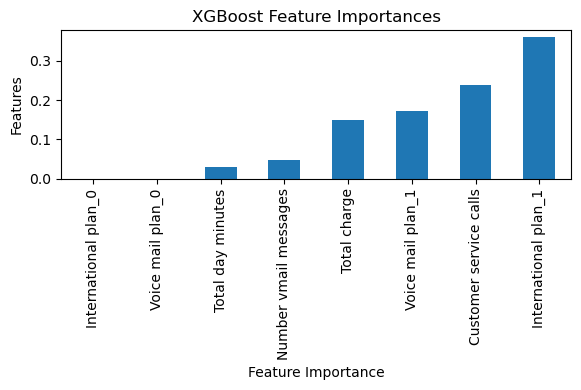

In [222]:
# Applying for features select from chi square
# Create a Series with feature importances and their corresponding feature names
xgboost_feature_importances = pd.Series(xgb_classifier.feature_importances_, index=X.columns).sort_values()

# Create a horizontal bar plot with larger figure size and rotated x-axis labels
plt.figure(figsize=(6,4))
xgboost_feature_importances .plot(kind='bar')  # Use 'barh' for horizontal bar plot
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('XGBoost Feature Importances')
plt.tight_layout()
plt.show()

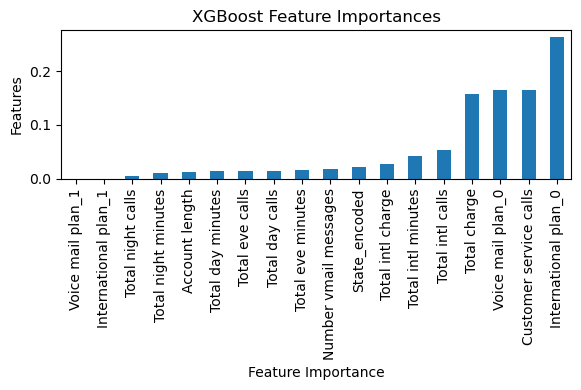

In [209]:
# Applying for the whole dataset after being preprocessed
# Create a Series with feature importances and their corresponding feature names
xgboost_feature_importances = pd.Series(xgb_classifier.feature_importances_, index=X.columns).sort_values()

# Create a horizontal bar plot with larger figure size and rotated x-axis labels
plt.figure(figsize=(6,4))
xgboost_feature_importances .plot(kind='bar')  # Use 'barh' for horizontal bar plot
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('XGBoost Feature Importances')
plt.tight_layout()
plt.show()

In [ ]:
# Extract the specified columns from X_encoded_df
chi_features = X_encoded_df[['International plan_1', 'International plan_0', 'Voice mail plan_1', 'Customer service calls', 
                             'Number vmail messages', 'Voice mail plan_0','Total charge', 'Total day minutes']].copy()